# <font color="red">VQ1 Codebook Hierarchical Clustering and Feature Spectra<font/>
1. Load "all" vqindhist of a given with batch output_layer = f'vqindhist{vq_idx}' (vq_idx=1) from batch X (batch_size, 2048)
2. Find a representatieve signature per marker - Group by marker ID and average vqindhist vectors (num_markers, 2048)
3. Find codewords that appear together - Calculate codewords correlaion matrix (between columns) (2048, 2048)
4. Hierarchical clustering on codewords correlation matrix. Decide on lables to include for codeword clustering (e.g., WT vs. stress, all markers).
5. Infer number of clusters (w/ Lena)
6. Sort vqind indecies accordingly
7. Decide on data (e.g., WT vs. stress, all markers) to be plotted as groups 
8. Generate (sorted) features spectra per group/label - which is re-sroting vqindhist indecies. and stacking histograms from the same group. 
8. Plotting feature spectras - a histogram for each group 
    
## <font color="purple">Finding rep images per codewords cluster<font/>
1. For every tile in the data, take the vqindhist, group by cluster, and sum histograms of all indices within one cluster. Output of this step is a histogram per tile (batch_size, num_clusters)
3. divide by 625 (number of codewords used to describe one image) to get percentages
4. For each tile, find the cluster with the maximum percentage
5. For every cluster, find top 4 images with highest percentage (which indicates the highest occurrence of the corresponding codewords in this cluster). (num_clusters,4)
    
    
 ## <font color="pink">Noam, update this or delete the detailed steps and just write overall description<font/>

In [1]:
import os
import sys

import scipy
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import warnings

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.spatial.distance import pdist
from scipy.stats import spearmanr, pearsonr

%matplotlib inline
%reload_ext autoreload
%autoreload 2
%aimport

os.environ['MOMAPS_HOME'] = '/home/labs/hornsteinlab/Collaboration/MOmaps'
sys.path.insert(1, os.getenv('MOMAPS_HOME'))
from src.common.lib.feature_spectra_utils import *

warnings.filterwarnings('ignore')



Modules to reload:
all-except-skipped

Modules to skip:



## Model, Embeddings and Output folder

In [2]:
MODEL_PATH = '/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/'
EMBEDDINGS_FOLDER = os.path.join(MODEL_PATH, 'embeddings', 'neurons', 'vqindhist1')
SAVE_PATH = '/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/figures/manuscript/fig2'

## Load vqindhist of batch 7&8

In [3]:
vqindhist, labels, paths = load_multiple_vqindhists(batches=['batch7','batch8'], 
                                                    embeddings_folder=EMBEDDINGS_FOLDER, 
                                                    datasets=['trainset','valset','testset'])


## Convert the histograms to a dataframe (hist_df) and add the label and path

In [4]:
hist_df = create_vqindhists_df(vqindhist, labels, paths)
print(hist_df.shape)
hist_df.sample(5)

(820972, 2050)


,0,1,2,3,4,5,6,7,8,9,...,2040,2041,2042,2043,2044,2045,2046,2047,path,label
767616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,ANXA11_SCNA_Untreated_batch8_rep2
161137,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,DAPI_TBK1_Untreated_batch7_rep2
602084,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,DAPI_TBK1_Untreated_batch8_rep1
747950,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,NONO_SCNA_Untreated_batch8_rep2
773586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,CLTC_SCNA_Untreated_batch8_rep2


# <font color="purple">Clustering of codebook vectors calculation step<font/>
## <font color="gray">Filter cell line, condition and markers<font/>

In [5]:
hist_df_wt = hist_df[hist_df.label.str.contains('WT') & hist_df.label.str.contains('Untreated')]
print(hist_df_wt.shape)
hist_df_wt = hist_df_wt[~hist_df_wt.label.str.contains('TIA1|FMRP', regex=True)] 
print(hist_df_wt.shape)
hist_df_wt.sample(5)


(102240, 2050)
(99376, 2050)


,0,1,2,3,4,5,6,7,8,9,...,2040,2041,2042,2043,2044,2045,2046,2047,path,label
364278,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,DAPI_WT_Untreated_batch7_rep2
112762,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,Phalloidin_WT_Untreated_batch7_rep1
38727,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,DAPI_WT_Untreated_batch7_rep1
36867,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,TOMM20_WT_Untreated_batch7_rep1
27233,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,15.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,GM130_WT_Untreated_batch7_rep1


Computing pearson correlation of 96 labels based on 2048 codebook vectors


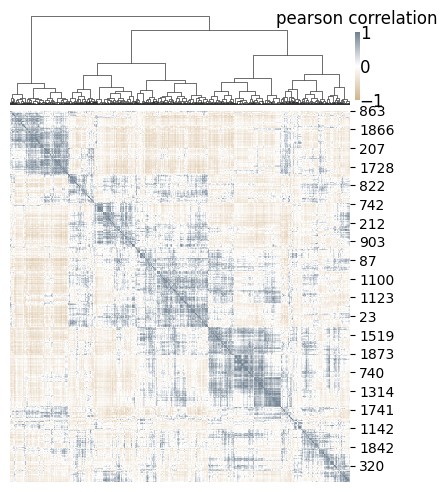

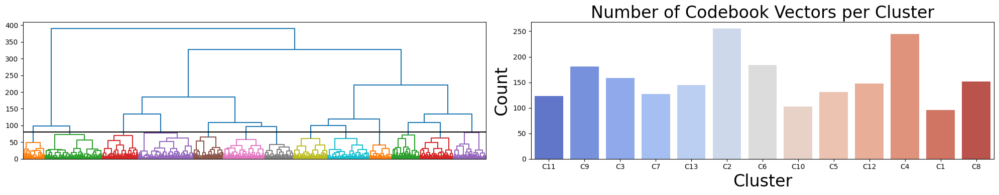

In [6]:
# correlate codebook vectors (heatmap)
clustermap, codebook_corr = create_codebook_heatmap(hist_df_wt.loc[:, hist_df_wt.columns!='path'], 
                                                            corr_method='pearson', 
                                                            calc_linkage=True, 
                                                            linkage_method='ward' #'complete', 'average', 'median', 'ward'
                                                           )


# decide on num of clusters by dendogram (and number of codebook vectors in each cluster)
corr_with_clusters = set_num_clusters_by_dendrogram(clustermap, 
                                                    codebook_corr, 
                                                    cutoff=80)

# Fetch the cluster assignment of each codebook vector
codebook_vec_cluster_assignment = corr_with_clusters[['cluster']]


In [7]:
# nancy stopeed here, this functino not yet find them, but noly retuns max cluster for each tile AKA assigns tile images to clusters 
# need to select the top and show them
find_representative_images_per_cluster(codebook_vec_cluster_assignment, hist_df_wt)

,C1,C10,C11,C12,C13,C2,C3,C4,C5,C6,C7,C8,C9,label,path,max_cluster,second_max_cluster
174,0.004287,0.000010,0.000121,0.000060,0.000030,0.001238,0.000121,0.000151,0.000040,0.000121,0.000091,0.000010,0.000010,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
175,0.004518,0.000020,0.000091,0.000091,0.000010,0.001228,0.000111,0.000101,0.000010,0.000030,0.000030,0.000010,0.000040,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
176,0.004569,0.000050,0.000201,0.000070,0.000060,0.000946,0.000081,0.000161,0.000040,0.000050,0.000010,0.000020,0.000030,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
177,0.003431,0.000081,0.000252,0.000101,0.000020,0.001701,0.000151,0.000282,0.000040,0.000091,0.000020,0.000010,0.000111,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
178,0.003703,0.000010,0.000081,0.000101,0.000010,0.002002,0.000121,0.000141,0.000060,0.000020,0.000000,0.000030,0.000010,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820891,0.000423,0.000070,0.000302,0.000463,0.000131,0.002828,0.000755,0.000302,0.000101,0.000473,0.000091,0.000272,0.000081,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820892,0.000382,0.000201,0.000403,0.000382,0.000191,0.003009,0.000574,0.000191,0.000151,0.000282,0.000040,0.000382,0.000101,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820893,0.000181,0.000161,0.000413,0.000564,0.000060,0.002888,0.000704,0.000181,0.000091,0.000654,0.000040,0.000262,0.000091,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820894,0.000252,0.000272,0.000513,0.000493,0.000181,0.002486,0.000704,0.000201,0.000081,0.000553,0.000070,0.000262,0.000221,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3


In [137]:


 
#plot_rep_tiles_conds(hist_per_cluster_average)

In [138]:
hist_per_cluster_average

,C1,C10,C11,C12,C13,C2,C3,C4,C5,C6,C7,C8,C9,label,path,max_cluster,second_max_cluster
174,0.004287,0.000010,0.000121,0.000060,0.000030,0.001238,0.000121,0.000151,0.000040,0.000121,0.000091,0.000010,0.000010,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
175,0.004518,0.000020,0.000091,0.000091,0.000010,0.001228,0.000111,0.000101,0.000010,0.000030,0.000030,0.000010,0.000040,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
176,0.004569,0.000050,0.000201,0.000070,0.000060,0.000946,0.000081,0.000161,0.000040,0.000050,0.000010,0.000020,0.000030,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
177,0.003431,0.000081,0.000252,0.000101,0.000020,0.001701,0.000151,0.000282,0.000040,0.000091,0.000020,0.000010,0.000111,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
178,0.003703,0.000010,0.000081,0.000101,0.000010,0.002002,0.000121,0.000141,0.000060,0.000020,0.000000,0.000030,0.000010,DAPI_WT_Untreated_batch7_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820891,0.000423,0.000070,0.000302,0.000463,0.000131,0.002828,0.000755,0.000302,0.000101,0.000473,0.000091,0.000272,0.000081,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820892,0.000382,0.000201,0.000403,0.000382,0.000191,0.003009,0.000574,0.000191,0.000151,0.000282,0.000040,0.000382,0.000101,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820893,0.000181,0.000161,0.000413,0.000564,0.000060,0.002888,0.000704,0.000181,0.000091,0.000654,0.000040,0.000262,0.000091,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3
820894,0.000252,0.000272,0.000513,0.000493,0.000181,0.002486,0.000704,0.000201,0.000081,0.000553,0.000070,0.000262,0.000221,NONO_WT_Untreated_batch8_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,2,3


In [ ]:
# clustermap, corr = create_codebook_heatmap(hist_df_wt, method='pearson', calc_linkage=False)
# #clustermap, corr = create_codebook_heatmap(hist_df_wt, method='spearman')

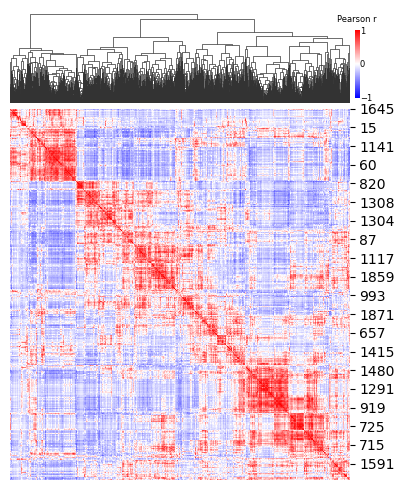

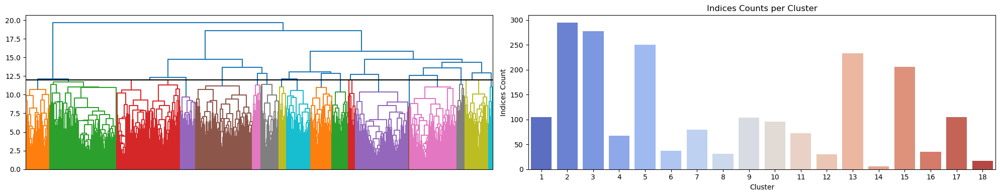

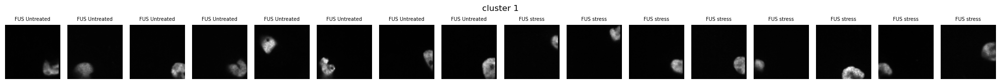

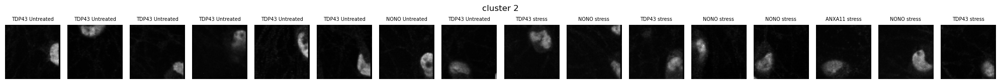

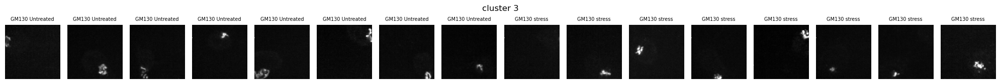

...

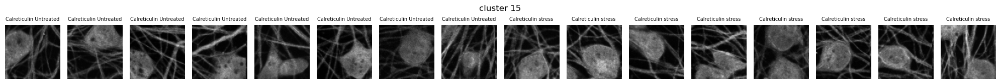

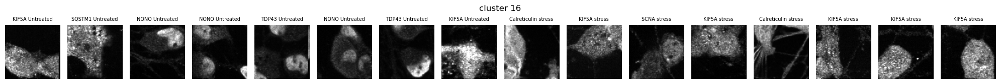

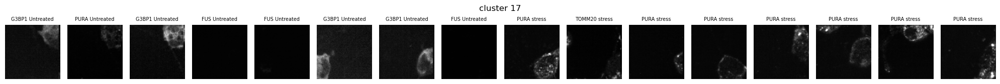

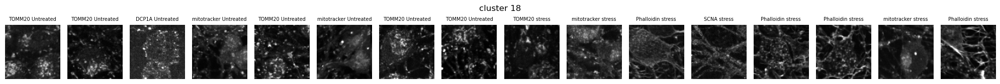

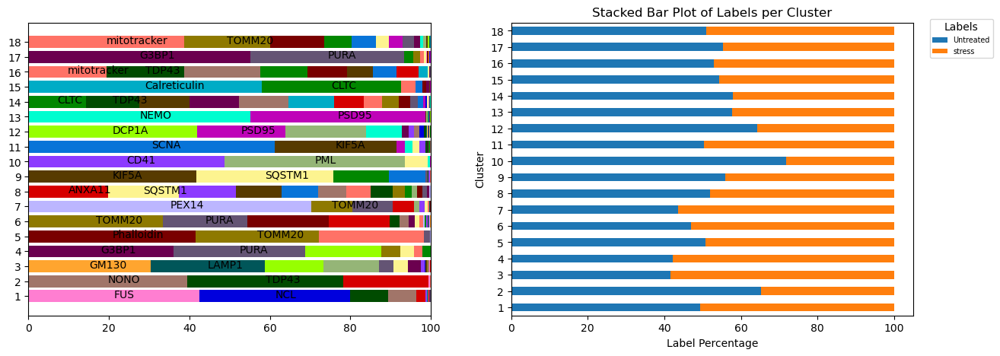

In [47]:
hist_per_cluster_complete

,C1,C10,C11,C12,C13,C2,C3,C4,C5,C6,C7,C8,C9,label,path,variance,max_cluster,second_max_cluster
52,0.061372,0.333333,0.134921,0.587379,1.829932,0.074380,0.118280,0.273885,0.129032,0.104839,0.444444,0.090615,0.084746,NCL_WT_stress_batch7_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.212399,13,12
53,0.057762,0.212121,0.198413,0.543689,2.190476,0.033058,0.064516,0.312102,0.090323,0.056452,0.322222,0.038835,0.084746,NCL_WT_stress_batch7_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.311387,13,12
54,0.151625,0.060606,0.079365,0.563107,1.598639,0.041322,0.043011,0.611465,0.316129,0.016129,0.411111,0.032362,0.084746,NCL_WT_stress_batch7_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.178761,13,4
55,0.046931,0.181818,0.103175,0.626214,2.027211,0.041322,0.053763,0.388535,0.109677,0.056452,0.300000,0.080906,0.073446,NCL_WT_stress_batch7_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.271840,13,12
56,0.155235,0.060606,0.158730,0.592233,1.517007,0.033058,0.107527,0.777070,0.187097,0.080645,0.311111,0.016181,0.028249,NCL_WT_stress_batch7_rep1,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.170371,13,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820897,0.794224,0.060606,0.103175,0.155340,0.108844,0.429752,0.204301,0.178344,0.470968,0.459677,0.966667,0.061489,0.028249,TOMM20_WT_stress_batch8_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.082103,7,1
820898,0.895307,0.121212,0.142857,0.082524,0.299320,0.347107,0.075269,0.140127,0.296774,0.459677,1.022222,0.055016,0.039548,TOMM20_WT_stress_batch8_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.093164,7,1
820899,0.722022,0.136364,0.150794,0.106796,0.040816,0.363636,0.107527,0.165605,0.522581,0.685484,0.822222,0.087379,0.124294,TOMM20_WT_stress_batch8_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.072025,7,1
820900,0.714801,0.075758,0.150794,0.087379,0.061224,0.272727,0.129032,0.095541,0.709677,0.927419,0.744444,0.035599,0.073446,TOMM20_WT_stress_batch8_rep2,/home/labs/hornsteinlab/Collaboration/MOmaps/i...,0.099725,6,7


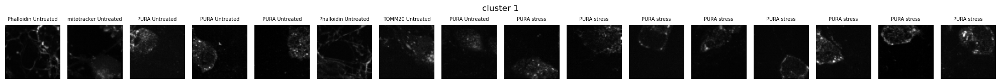

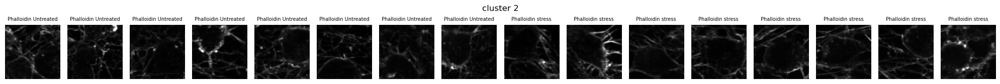

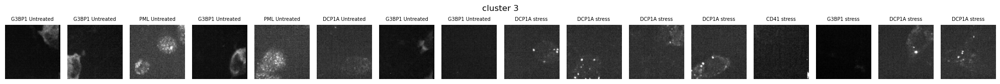

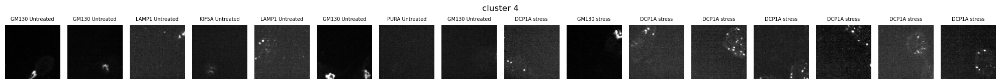

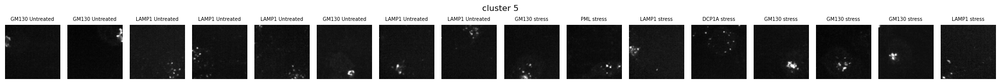

...

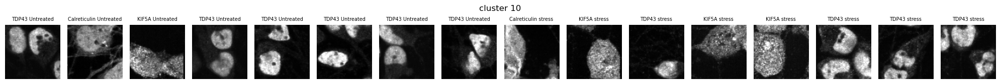

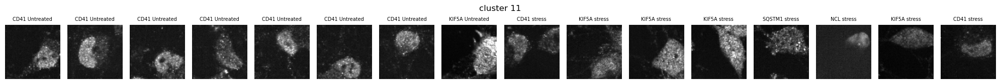

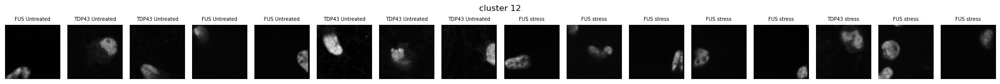

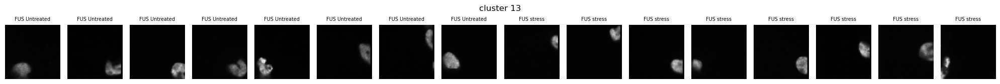

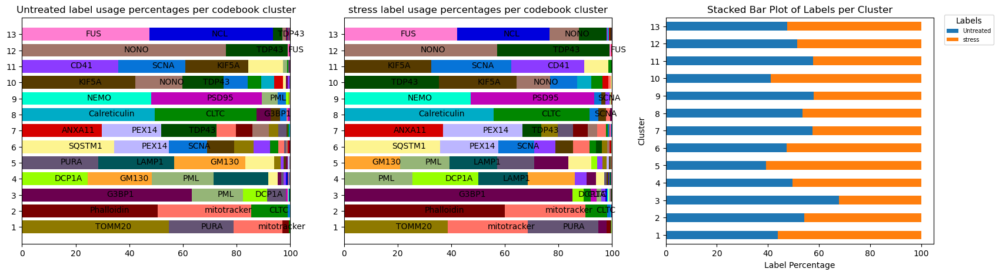

In [48]:
# clustermap_complete, corr_complete = create_codebook_heatmap(hist_df_wt, method='pearson', calc_linkage=True, linkage_method='complete')
# corr_with_clusters_complete = cut_dendrogram_get_clusters(clustermap_complete, corr_complete, cutoff=21)
# hist_per_cluster_complete = find_rep_per_cluster(corr_with_clusters_complete, hist_df_with_path_wt, to_save=False,save_path=None)
plot_rep_tiles_conds(hist_per_cluster_complete)

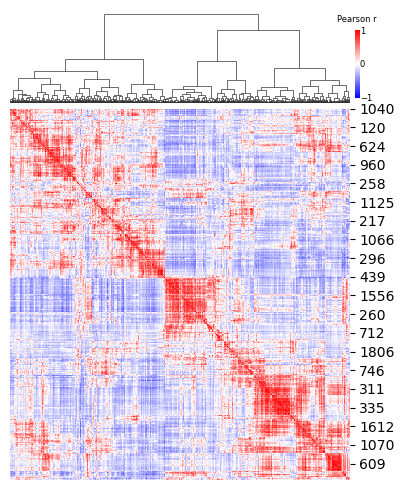

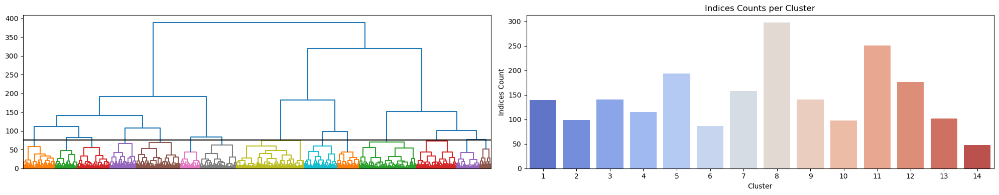

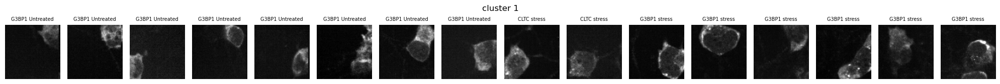

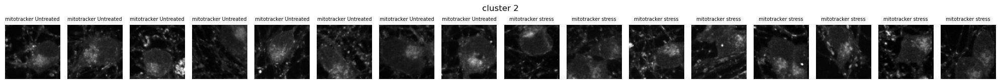

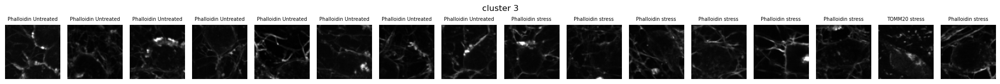

...

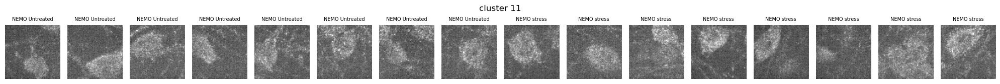

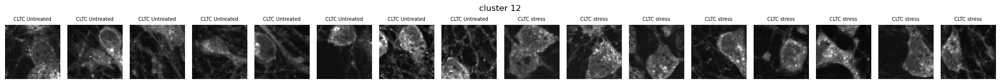

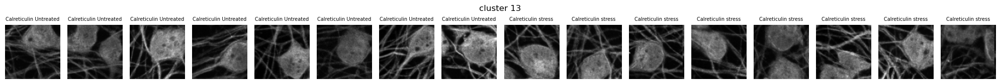

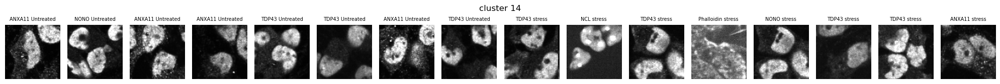

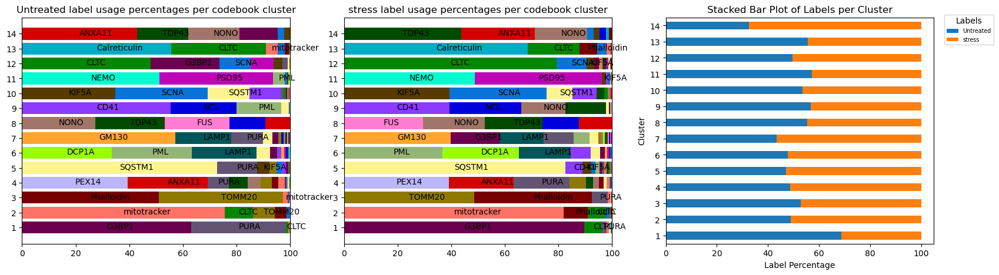

In [79]:
clustermap_ward, corr_ward = create_codebook_heatmap(hist_df_wt, method='pearson', calc_linkage=True, linkage_method='ward')
corr_with_clusters_ward = cut_dendrogram_get_clusters(clustermap_ward, corr_ward, cutoff=75)
hist_per_cluster_ward = find_rep_per_cluster(corr_with_clusters_ward, hist_df_with_path_wt, to_save=False,save_path=None)
plot_rep_tiles_conds(hist_per_cluster_ward)

#### Find representative images per cluster

In [ ]:
# plot all images together
find_rep_per_cluster(corr_with_clusters, hist_df_with_path_wt_untreated, to_save=True, 
                     save_path=SAVE_PATH, filename="wt_representative_images_per_cluster.eps", 
                     figsize=(5,36),
                    use_second_max=True, save_together=True)

# plot each image separatly
find_rep_per_cluster(corr_with_clusters, hist_df_with_path_wt_untreated, to_save=True, 
                     save_path=SAVE_PATH, figsize=(5,36),
                    use_second_max=True, save_together=False)

NameError: name 'hist_df_with_path_wt_untreated' is not defined

In [10]:
## Load other batches vqindhists
# vqindhist_all, labels_all, paths_all = load_multiple_vqindhists(batches = [f'batch{i}' for i in [3,4,6,9]], embeddings_folder = EMBEDDINGS_FOLDER, 
#                                                     datasets = ['allset'])

vqindhist_all, labels_all, paths_all = load_multiple_vqindhists(batches = [f'batch{i}' for i in [6]], embeddings_folder = EMBEDDINGS_FOLDER, 
                                                    datasets = ['all'])

In [11]:
## Add also batches 7+8
vqindhist_all = vqindhist_all + vqindhist
labels_all = labels_all + labels
paths_all = paths_all + paths

In [12]:
## Unite all data in df
hist_df_all, _ = create_vqindhists_df(vqindhist_all, labels_all, paths_all)
hist_df_all

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_FUSHeterozygous_Untreated_batch6_rep1
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_FUSHeterozygous_Untreated_batch6_rep1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_FUSHeterozygous_Untreated_batch6_rep1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,ANXA11_FUSHeterozygous_Untreated_batch6_rep1
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,ANXA11_FUSHeterozygous_Untreated_batch6_rep1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1258330,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,PML_TBK1_Untreated_batch8_rep2
1258331,1.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PML_TBK1_Untreated_batch8_rep2
1258332,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,8.0,PML_TBK1_Untreated_batch8_rep2
1258333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PML_TBK1_Untreated_batch8_rep2


In [13]:
## Prepare data for hisograms
hist_df_wt_untreated_agg = hist_df_wt[hist_df_wt.label.str.contains('WT_Untreated')] # taking only wt untreated
hist_df_wt_untreated_agg['label'] = hist_df_wt_untreated_agg['label'].str.split("_").str[0] # merging different batches and reps -> label == marker

hist_df_all_wt_untreated = hist_df_all[hist_df_all.label.str.contains('WT_Untreated')]
hist_df_all_wt_untreated = hist_df_all_wt_untreated[~hist_df_all_wt_untreated.label.str.contains('TIA1|FMRP|DAPI', regex=True)]
hist_df_all_wt_untreated_agg = hist_df_all_wt_untreated.copy()
hist_df_all_wt_untreated_agg['label'] = hist_df_all_wt_untreated_agg['label'].str.split("_").str[0] # merging different batches and reps -> label == marker

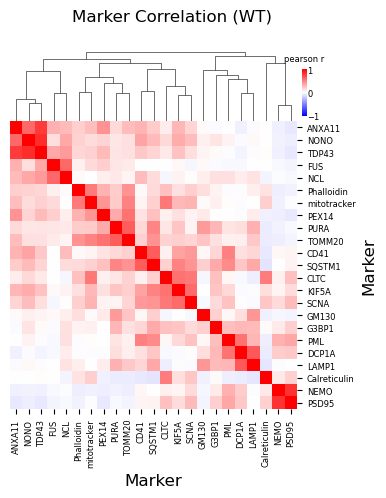

In [14]:
## Correlate marker histograms to get marker order
average_markers_wt = hist_df_wt_untreated_agg.groupby('label').mean()

marker_order, _ = create_lables_heatmap(average_markers_wt, 'Marker Correlation (WT)')
# marker_order, _ = create_lables_heatmap(average_markers_wt, 'Marker Correlation (WT)', method='spearman')
# marker_order, _ = create_lables_heatmap(average_markers_wt, 'Marker Correlation (WT)', method='kendall')

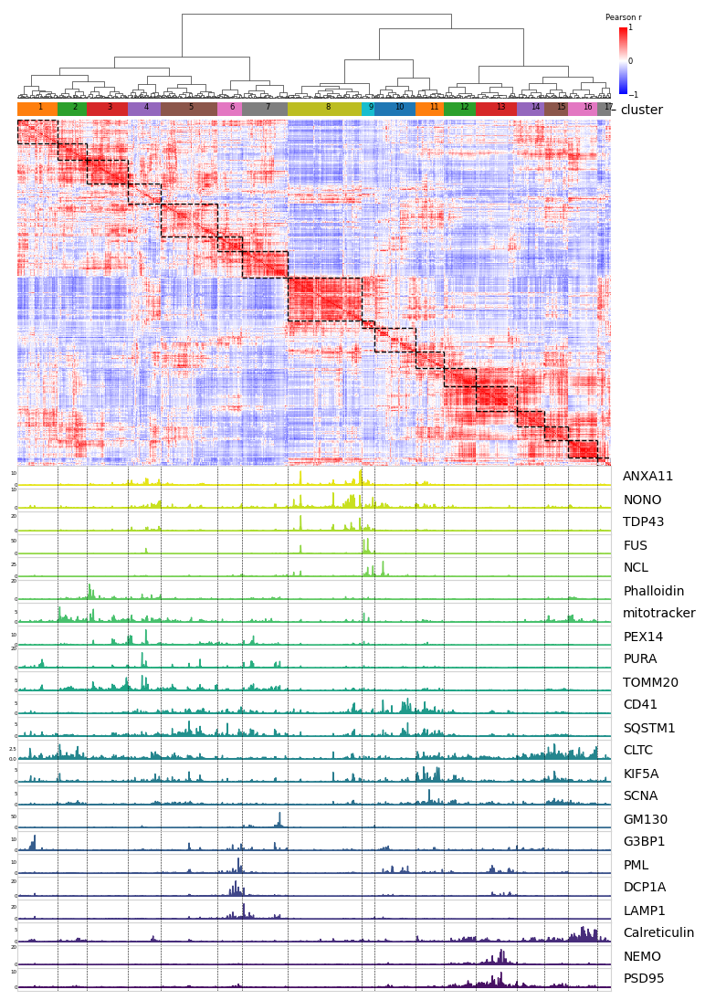

In [55]:
plot_heatmap_with_clusters_and_histograms(corr_with_clusters_ward, hist_df_all_wt_untreated_agg, 
                                          labels=list(marker_order), save_path=SAVE_PATH,
                                             filename="wt_untreated_heatmap.png", to_save=False, calc_linkage=True, linkage_method='ward')

In [58]:
hist_df_all_wt = hist_df_all[hist_df_all.label.str.contains('WT')]
hist_df_all_wt = hist_df_all_wt[~hist_df_all_wt.label.str.contains('TIA1|FMRP|DAPI', regex=True)]
hist_df_all_wt_agg = hist_df_all_wt.copy()
hist_df_all_wt_agg['label'] = hist_df_all_wt['label'].str.split("_").str[0:3:2].apply(lambda x: '_'.join(x)) # merging different batches and reps -> label == marker_cond
hist_df_all_wt_agg

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
331064,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,3.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,ANXA11_Untreated
331065,0.0,0.0,9.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,ANXA11_Untreated
331066,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
331067,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
331068,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1258260,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,TOMM20_stress
1258261,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,4.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,TOMM20_stress
1258262,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,...,0.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,TOMM20_stress
1258263,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,TOMM20_stress


In [148]:
## Prepare data for hisograms (stress vs untreated)
hist_df_wt_agg = hist_df_wt.copy()
hist_df_wt_agg['label'] = hist_df_wt_agg['label'].str.split("_").str[0:3:2].apply(lambda x: '_'.join(x)) # merging different batches and reps -> label == marker_cond

In [ ]:
plot_heatmap_with_clusters_and_histograms(corr_with_clusters, hist_df_wt_agg, 
                                          labels=['FMRP','PML','G3BP1','PURA','TOMM20','SQSTM1',
                                                  'mitotracker','TDP43','PSD95','DCP1A'], 
                                          save_path=SAVE_PATH, color_by_cond=True,
                                         sep_histograms=True, to_save=True, figsize=(10,6),
                                         filename = "wt_stress_vs_untreated.eps", calc_linkage=True, linkage_method='ward')

In [ ]:
# plot_heatmap_with_clusters_and_histograms(corr_with_clusters, wt, labels=['FMRP','PML','G3BP1','PURA','TOMM20','SQSTM1','mitotracker',
#                                                                    'TDP43','PSD95','DCP1A'], to_save=True,
#                                           save_path=SAVE_PATH, plot_delta=True, div=True, filename = "codeword_idx_heatmap_and_histograms_delta_div.tiff")

DCP1A
0.07799102
SQSTM1
0.022456242
mitotracker
0.036135837
G3BP1
0.39636633
TDP43
0.26652986
PURA
0.7175626
TOMM20
0.058560695
NCL
0.16395195
PSD95
0.04048831
PML
0.54202604


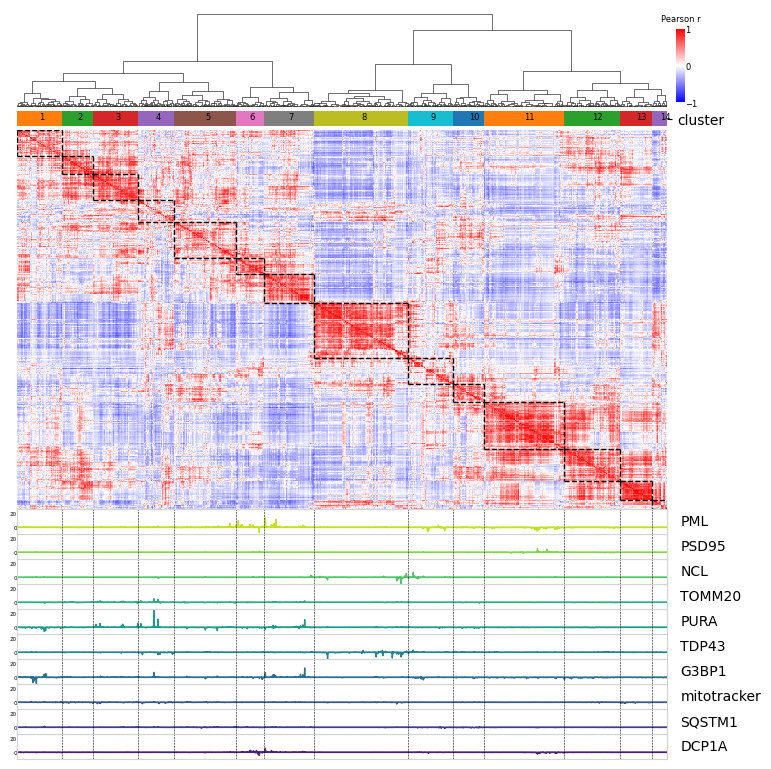

In [78]:
plot_heatmap_with_clusters_and_histograms(corr_with_clusters_ward, hist_df_all_wt_agg,# labels=[''],
                                          labels=['PML','G3BP1','PURA','TOMM20','SQSTM1', 'NCL',
                                                  'mitotracker','TDP43','PSD95','DCP1A',], 
                                          to_save=False, div=False,sep_histograms=False,  calc_linkage=True, linkage_method='ward',
                                          save_path=SAVE_PATH, plot_delta=True, filename = "wt_delta.eps")

## New part: correlate delta histograms and create a graph network of marker deltas

In [41]:
markers = np.unique(wt['label'].str.split("_").str[0])

average_hist = wt.groupby('label').mean()
deltas = pd.DataFrame(index = markers, columns=average_hist.columns)
deltas_div = pd.DataFrame(index = markers, columns=average_hist.columns)


In [42]:
# calc delta and save in a new df
for marker in markers:
    stress = average_hist.loc[f'{marker}_stress']
    Untreated =  average_hist.loc[f'{marker}_Untreated']
    deltas.loc[marker] =  stress - Untreated
    stress = stress.apply(lambda x: 1 if x < 1 else x)
    Untreated = Untreated.apply(lambda x: 1 if x == 0 else x)

    deltas_div.loc[marker] = np.log2((stress / Untreated))


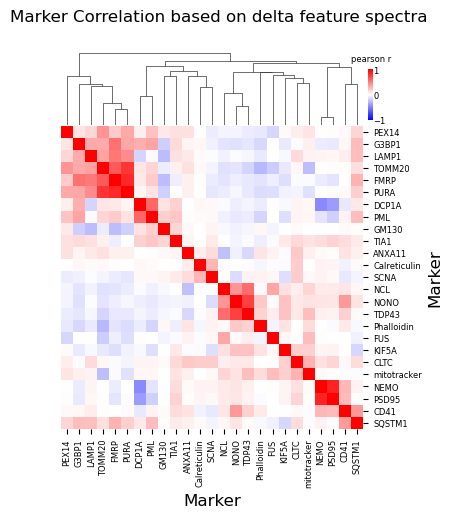

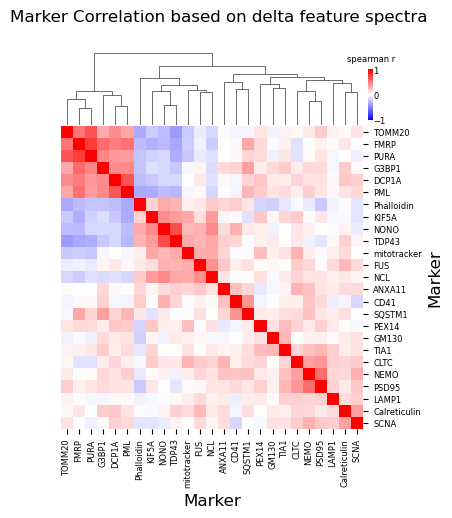

In [46]:
_, marker_delta_corr = create_lables_heatmap(deltas, 'Marker Correlation based on delta feature spectra',save_path=SAVE_PATH, 
                                             to_save=True, filename='wt_delta_heatmap.eps')
_, marker_delta_corr_spear = create_lables_heatmap(deltas, 'Marker Correlation based on delta feature spectra', method='spearman')

# _, marker_delta_corr_div = create_lables_heatmap(deltas_div, 'Marker Correlation based on delta feature spectra (div)')


In [ ]:
# fig, ax = plt.subplots(figsize=(2,2))
# deltas.T.plot.scatter(x='FMRP', y='PURA', ax=ax,c='purple')
# ax.set_title(f"Pearson coefficient: {round(marker_delta_corr.loc['FMRP','PURA'],2)}")
# plt.plot(np.linspace(min(deltas.T['FMRP']), max(deltas.T['FMRP']), 100),
#          np.linspace(min(deltas.T['FMRP']), max(deltas.T['FMRP']), 100), color='black', linestyle='--', label='Diagonal Line')
# plt.show()

# experiments with pairplot

In [ ]:
# clustermap = sns.clustermap(corr_with_clusters.drop(columns=['cluster']), center=0, cmap='bwr', vmin=-1, vmax=1, figsize=(9,5), xticklabels=False, yticklabels=False, col_colors=corr_with_clusters.cluster)

# # get the indices order from the dendrogram 
# hierarchical_order = clustermap.dendrogram_col.reordered_ind
# data_order=pd.merge(left=deltas[hierarchical_order].T, right=corr_with_clusters.cluster, left_index=True, right_index=True)
# data=pd.merge(left=deltas.T, right=corr_with_clusters.cluster, left_index=True, right_index=True)



In [ ]:
# from IPython.display import Image

# pair = sns.pairplot(data_order.drop(columns=['cluster']), height=1.5, diag_kind=None, #hue='cluster',
#                    plot_kws=dict(s=5, alpha=0.5), vars=['FUS','FMRP'])
# # for i, ax in enumerate(pair.axes.flat):
# #     ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
# #     ax.set_yticklabels(ax.get_yticklabels(), rotation=45, ha='right')
# #plt.show()
# plt.setp(pair.axes[1,0].get_yticklabels(), visible=True)
# plt.tight_layout()
# # # Get the number of variables
# # num_vars = len(pair.data.columns)#[:-1])

# # # Add text annotations to each subplot
# # for i, ax in enumerate(pair.axes.flat):
# #     if i % (num_vars + 1) == 0:  # Skip diagonal subplots
# #         continue
    
# #     # Adjust the coordinates based on your preference
# #     x_coord = 0.02
# #     y_coord = 0.9
# #     row_marker = pair.data.columns[i//num_vars]
# #     column_marker = pair.data.columns[i%num_vars]
# #     ax.text(x_coord, y_coord, f"\u03C1: {round(marker_delta_corr.loc[row_marker,column_marker],2)}", 
# #              transform=ax.transAxes, fontsize=6)
# #     ax.text(x_coord, y_coord-0.1, f"\u03C1': {round(marker_delta_corr_spear.loc[row_marker,column_marker],2)}", 
# #              transform=ax.transAxes, fontsize=6)
# #     ax.axhline(y=0, xmin=0, xmax=1, color='black',linewidth=0.5)
# #     ax.axvline(x=0, ymin=0, ymax=1, color='black',linewidth=0.5)
# # pair.savefig("pairplot.png")

# # plt.clf() # Clean parirplot figure from sns 
# # Image(filename='pairplot.png') # Show pairplot as image

In [22]:
# wt = hist_df[0].copy()
wt = wt[wt.label.str.contains('WT')]
wt = wt[~wt.label.str.contains('FMRP|TIA1', regex=True)]
wt['label'] = wt.label.str.split('_').str[0:3:2].apply(lambda x: '_'.join(x))
wt

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
52,0.0,0.0,0.0,0.0,5.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NCL_stress
53,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NCL_stress
54,0.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NCL_stress
55,4.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NCL_stress
56,4.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NCL_stress
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
820897,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,2.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,TOMM20_stress
820898,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,4.0,14.0,0.0,0.0,0.0,0.0,0.0,0.0,TOMM20_stress
820899,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,2.0,...,0.0,3.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,TOMM20_stress
820900,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,8.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,TOMM20_stress


In [23]:
markers = np.unique(wt['label'].str.split("_").str[0])

average_hist = wt.groupby('label').mean()
deltas = pd.DataFrame(index = markers, columns=average_hist.columns)

In [26]:
# calc delta and save in a new df
for marker in markers:
    stress = average_hist.loc[f'{marker}_stress']
    Untreated =  average_hist.loc[f'{marker}_Untreated']
    deltas.loc[marker] =  stress - Untreated

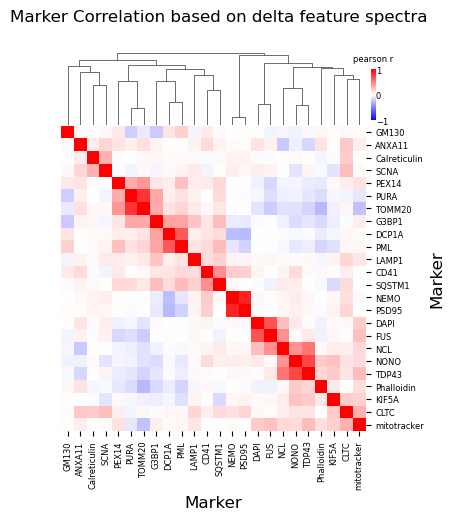

In [30]:
_, marker_delta_corr = create_lables_heatmap(deltas, 'Marker Correlation based on delta feature spectra',save_path=SAVE_PATH, 
                                             to_save=False, filename='wt_delta_heatmap.eps')

In [236]:
BaseConfig().UMAP_MAPPINGS_MARKERS

{'NCL': {'alias': 'Nucleolus', 'color': 'red'},
 'FUS': {'alias': 'Heterogeneous Nuclear Ribonucleoprotein (hnRNP) Complexes',
  'color': 'salmon'},
 'DAPI': {'alias': 'Nucleus', 'color': 'mediumaquamarine'},
 'PML': {'alias': 'Promyelocytic Leukaemia (PML) Nuclear Bodies',
  'color': 'darkred'},
 'ANXA11': {'alias': 'ANXA11-granules', 'color': 'darkorange'},
 'NONO': {'alias': 'Paraspeckles', 'color': 'orange'},
 'TDP43': {'alias': 'TDP-43-granules', 'color': 'gold'},
 'PEX14': {'alias': 'Peroxisomes', 'color': 'black'},
 'Calreticulin': {'alias': 'Endoplasmic Reticulum (ER)',
  'color': 'saddlebrown'},
 'Phalloidin': {'alias': 'Actin Cytoskeleton', 'color': 'darkviolet'},
 'mitotracker': {'alias': 'Mitochondria', 'color': 'pink'},
 'TOMM20': {'alias': 'Mitochondria Outer Membrane', 'color': 'palevioletred'},
 'PURA': {'alias': 'PURA-granules', 'color': 'deeppink'},
 'CLTC': {'alias': 'Coated Vesicles', 'color': 'magenta'},
 'KIF5A': {'alias': 'Microtubule-Associated Transport Machine

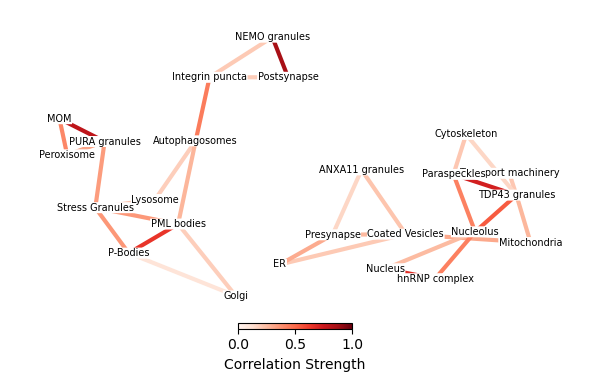

In [278]:
positive_graph = create_correlation_graph(marker_delta_corr, top_positive=True, scale_factor=10)
draw_correlation_graph(positive_graph, '', cmap=plt.get_cmap('Reds'), vmin=0, vmax=1)

# negative_graph = create_correlation_graph(marker_delta_corr, top_positive=False)
# draw_correlation_graph(negative_graph, 'Negative Correlation Graph', cmap=plt.get_cmap('Blues_r'), vmin=-1, vmax=0)

# graph = create_bicorrelation_graph(marker_delta_corr)
# draw_bicorrelation_graph(graph, title = 'Stress vs. Untreated changes similiarty between markers', cmap_pos = plt.get_cmap('Reds'), 
#                          cmap_neg = plt.get_cmap('Blues_r'),
#                         save_path=SAVE_PATH, filename="wt_delta_correlation_graph.png", to_save=False)

In [152]:
df = pd.DataFrame(columns=['node_a','node_b','weight'])
for i,edge in enumerate(positive_graph.edges(data=True)):
    new_row = pd.DataFrame(data={'node_a': edge[0], 'node_b': edge[1],'weight':edge[2]['scaled_weight']}, index=[i])
    # Append the new row to the DataFrame
    df=pd.concat([df,new_row])
df.sort_values(by='weight')


,node_a,node_b,weight
20,DCP1A,GM130,1.030505
1,ANXA11,SCNA,1.567645
29,TDP43,Phalloidin,1.595626
9,SQSTM1,LAMP1,1.845635
22,PML,GM130,1.867451
8,CD41,PSD95,1.913997
4,CLTC,Calreticulin,2.004212
7,CD41,NEMO,2.025351
26,KIF5A,TDP43,2.070359
28,NONO,Phalloidin,2.086891


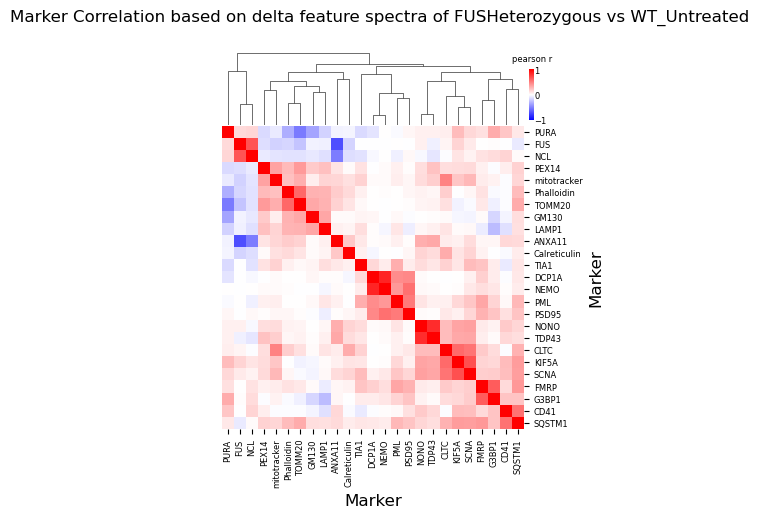

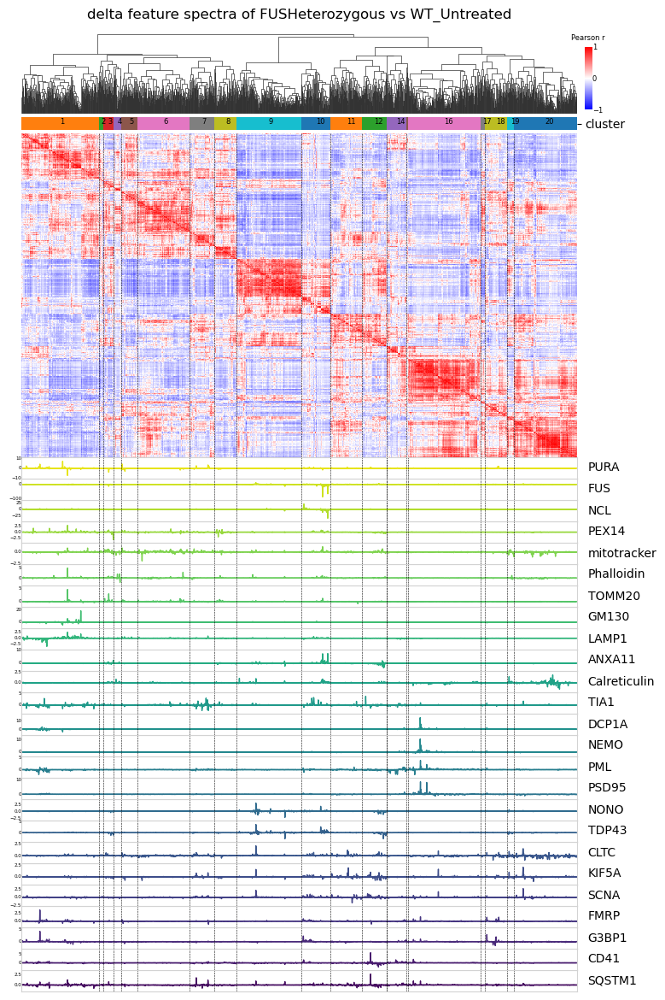

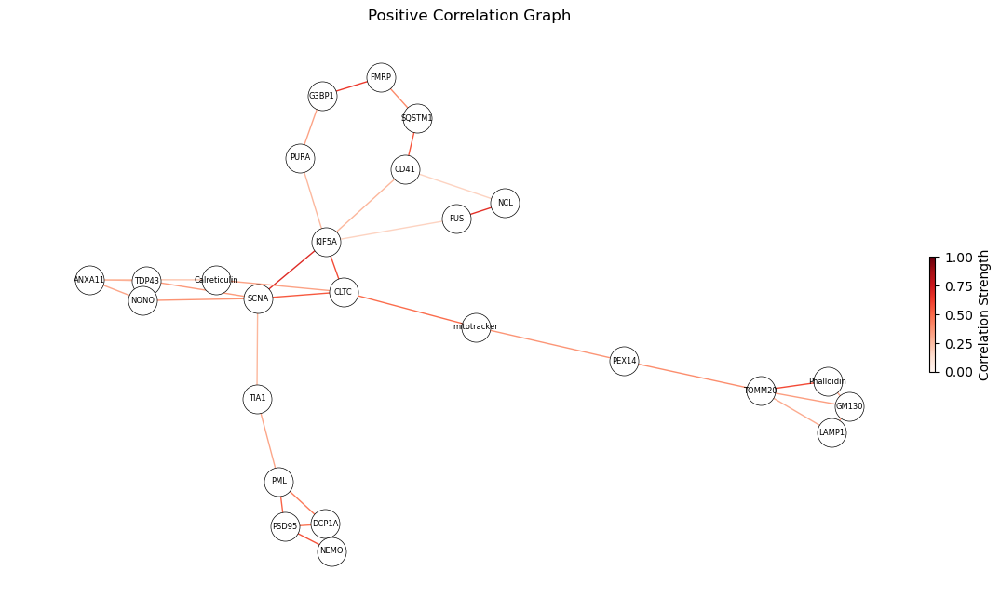

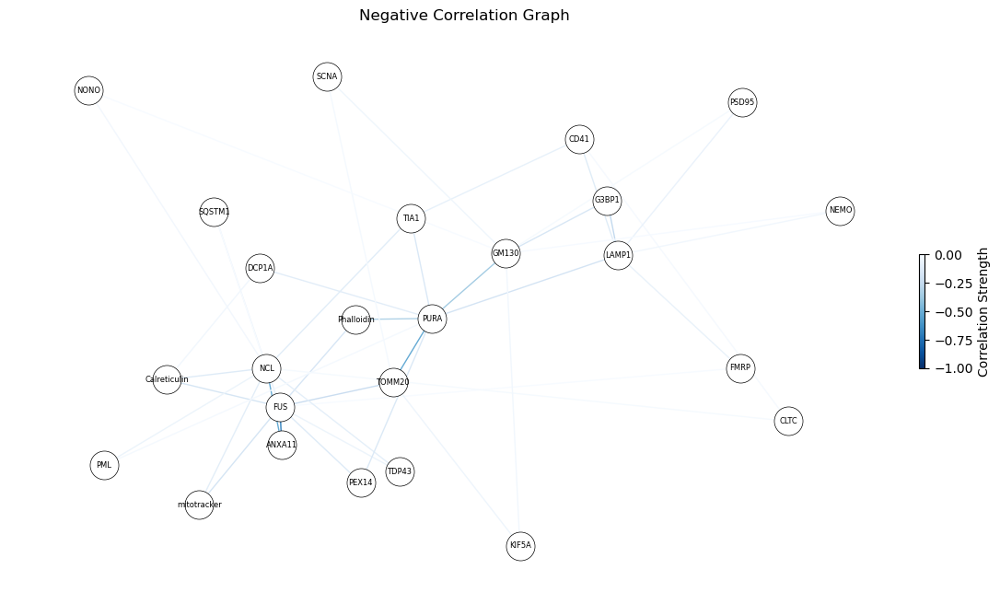

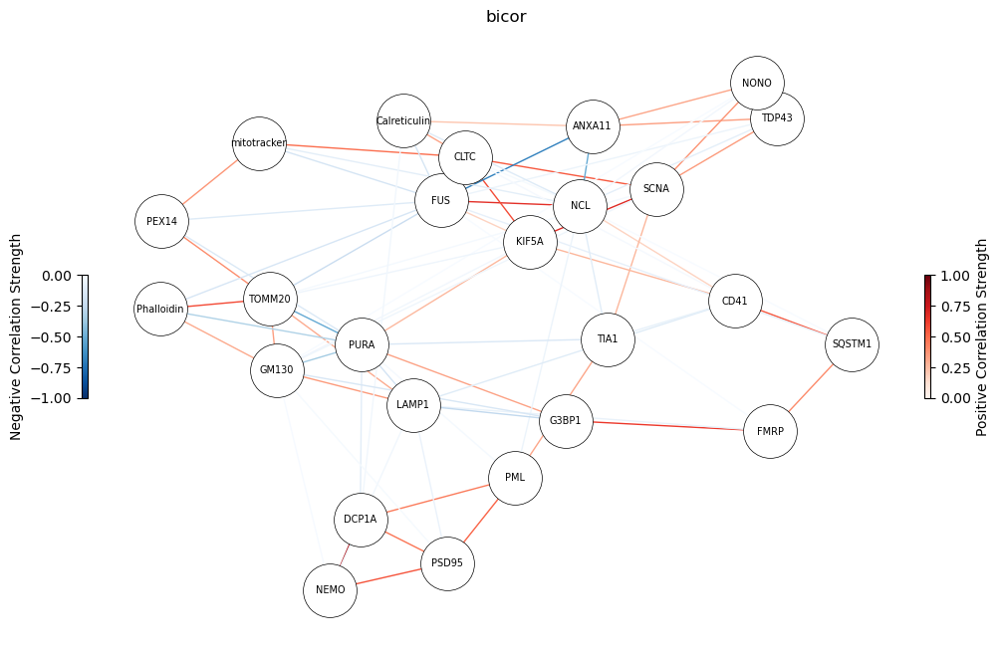

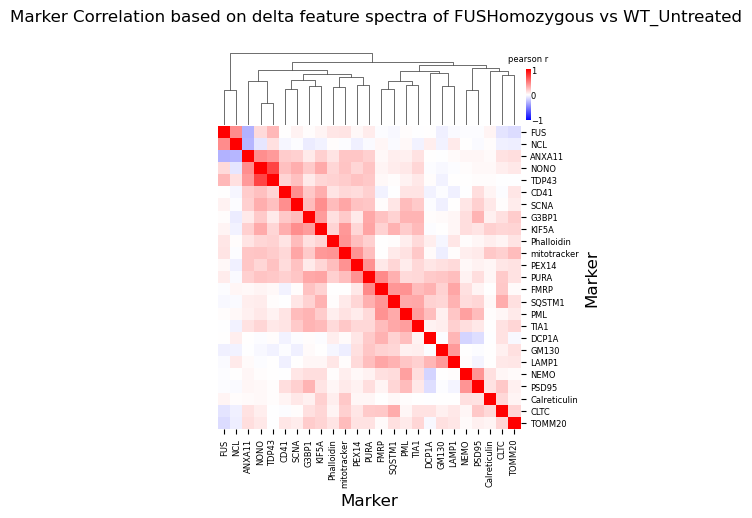


KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x2aac99579f70> (for post_execute):



KeyboardInterrupt



Error in callback <function flush_figures at 0x2aaca93c19d0> (for post_execute):



KeyboardInterrupt



In [52]:
# for first_cond, second_cond in zip(['FUSHeterozygous', 'FUSHomozygous','FUSHomozygous','FUSHeterozygous'],['WT_Untreated','WT_Untreated','FUSRevertant','FUSRevertant']):
#     ## Prepare data for hisograms (first vs second)
#     df = all_lines_hist_df.copy()
#     df = df[df.label.str.contains(f'{first_cond}|{second_cond}', regex=True)]  #taking only wt 
#     df['label'] = df['label'].str.split("_").str[0:2].apply(lambda x: '_'.join(x)) # merging different batches and reps -> label == marker_cellline
    
#     markers = np.unique(df['label'].str.split("_").str[0])

#     average_hist = df.groupby('label').mean()
#     deltas = pd.DataFrame(index = markers, columns=average_hist.columns)
    
#     # calc delta and save in a new df
#     for marker in markers:
#         first = average_hist.loc[f'{marker}_{first_cond}']
#         second =  average_hist.loc[f'{marker}_{second_cond.replace("_Untreated","")}']
#         deltas.loc[marker] =  first - second

#     markers_order, marker_delta_corr = create_lables_heatmap(deltas, f'Marker Correlation based on delta feature spectra of {first_cond} vs {second_cond}',
#                                          save_path=SAVE_PATH, to_save=True, filename=f"{first_cond}_vs_{second_cond}_delta_marker_correlation.png")

    
#     plot_heatmap_with_clusters_and_histograms(corr_with_clusters, df, labels=list(markers_order), 
#                                           to_save=False,
#                                           save_path=SAVE_PATH, plot_delta=True, div=False, 
#                                               filename = f"codeword_idx_heatmap_and_histograms_delta_{first_cond}_vs_{second_cond}.png",
#                                          first_cond=first_cond, 
#                                               second_cond=second_cond.replace("_Untreated",""), 
#                                               title=f'delta feature spectra of {first_cond} vs {second_cond}')
    
#     positive_graph = create_correlation_graph(marker_delta_corr, top_positive=True)
#     draw_correlation_graph(positive_graph, 'Positive Correlation Graph', cmap=plt.get_cmap('Reds'), vmin=0, vmax=1)

#     negative_graph = create_correlation_graph(marker_delta_corr, top_positive=False)
#     draw_correlation_graph(negative_graph, 'Negative Correlation Graph', cmap=plt.get_cmap('Blues_r'), vmin=-1, vmax=0)
    
    
#     graph = create_bicorrelation_graph(marker_delta_corr)
#     draw_bicorrelation_graph(graph, 'bicor', cmap_pos = plt.get_cmap('Reds'), 
#                              cmap_neg = plt.get_cmap('Blues_r'))

FUSHeterozygous
WT_Untreated


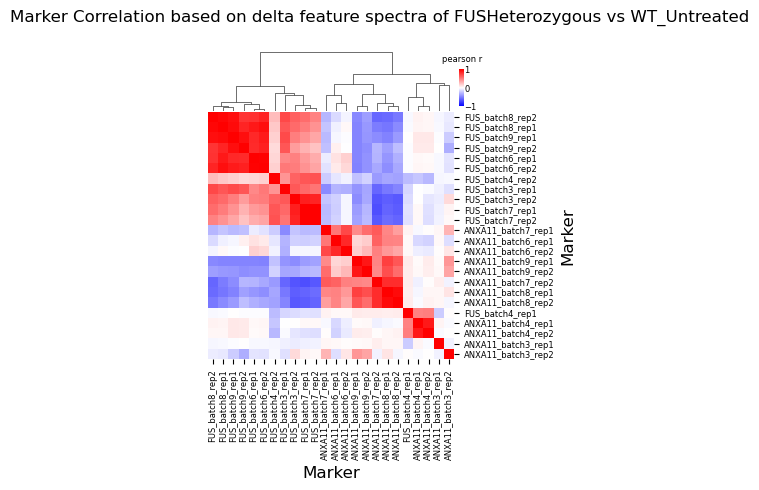

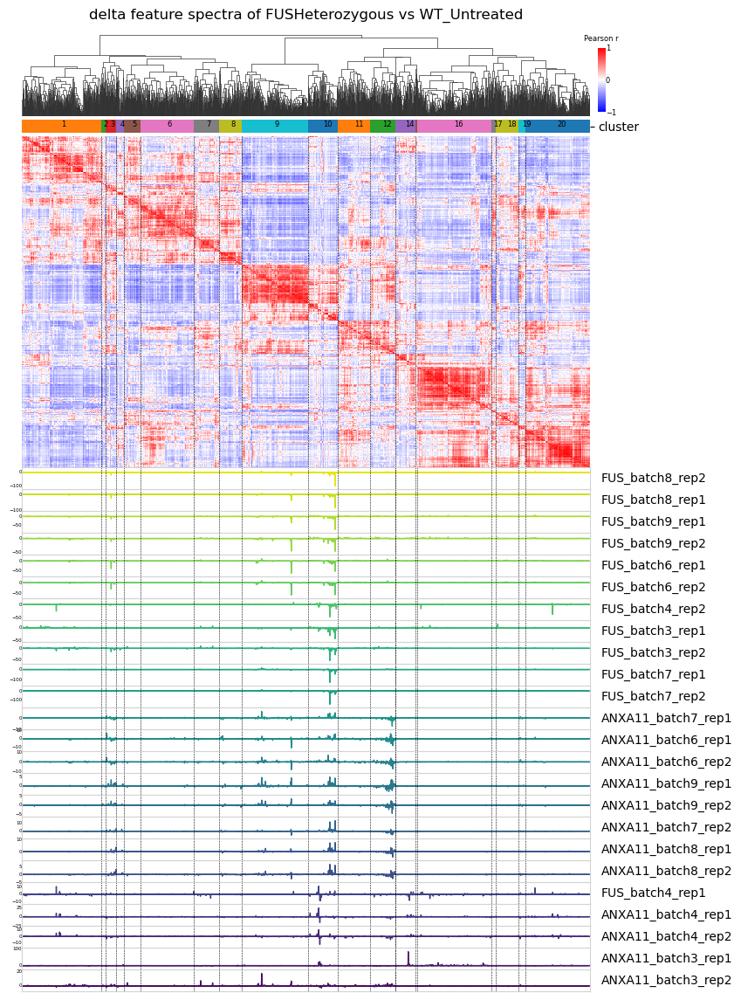

In [54]:
for first_cond, second_cond in zip(['FUSHeterozygous', 'FUSHomozygous','FUSHomozygous','FUSHeterozygous'],['WT_Untreated','WT_Untreated','FUSRevertant','FUSRevertant']):
    print(first_cond)
    print(second_cond)
    ## Prepare data for hisograms (first vs second)
    cur_pair_df = hist_df_all[hist_df_all.label.str.contains(f'{first_cond}|{second_cond}', regex=True)]
    
    markers =['FUS','ANXA11']
    cur_pair_df = cur_pair_df[cur_pair_df.label.str.contains('ANXA11|FUS_', regex=True)]
    deltas = []
    for batch in [f'batch{i}' for i in [3,4,6,7,8,9]]:
        cur_batch_df = cur_pair_df[cur_pair_df.label.str.contains(batch)]
        for rep in [f'rep{j}' for j in range(1,3)]:
            cur_rep_df = cur_batch_df[cur_batch_df.label.str.contains(rep)]
            cur_rep_df['label'] = cur_rep_df['label'].str.split("_").str[0:2].apply(lambda x: '_'.join(x)) # merging different batches and reps -> label == marker_cellline
            average_hist = cur_rep_df.groupby('label').mean()
            cur_deltas = pd.DataFrame(index = markers, columns=average_hist.columns)
            # calc delta and save in a new df
            for marker in markers:
                first = average_hist.loc[f'{marker}_{first_cond}']
                second =  average_hist.loc[f'{marker}_{second_cond.replace("_Untreated","")}']
                cur_deltas.loc[marker] =  first - second
            cur_deltas.set_index(cur_deltas.index + f"_{batch}_{rep}", inplace=True)
            deltas.append(cur_deltas)
            
    deltas = pd.concat(deltas)
    deltas = deltas.astype('float')
    markers_order, _ = create_lables_heatmap(deltas, f'Marker Correlation based on delta feature spectra of {first_cond} vs {second_cond}',
                                         save_path=SAVE_PATH, to_save=False, filename=f"{first_cond}_vs_{second_cond}_delta_marker_correlation.png")
    
    deltas = deltas.reset_index(names='label')

    plot_heatmap_with_clusters_and_histograms(corr_with_clusters, deltas, labels=list(markers_order), 
                                          to_save=True,
                                          save_path=SAVE_PATH, plot_delta=False, div=False, 
                                              filename = f"all_batches_{first_cond}_vs_{second_cond}.png",
                                         first_cond=first_cond, sep_histograms=False,
                                              second_cond=second_cond.replace("_Untreated",""), 
                                              title=f'delta feature spectra of {first_cond} vs {second_cond}')
    break

In [110]:
import numpy as np
import pandas as pd
import  torch
import datetime

from src.common.lib.dataset import Dataset
from src.common.lib.utils import get_if_exists, load_config_file
from src.common.lib.model import Model
from src.common.lib.data_loader import get_dataloader
from src.datasets.dataset_spd import DatasetSPD

os.environ['MOMAPS_DATA_HOME'] = '/home/labs/hornsteinlab/Collaboration/MOmaps/input'
sys.path.insert(1, os.getenv('MOMAPS_DATA_HOME'))

In [115]:
config_path_model = "./src/models/neuroself/configs/model_config/TLNeuroselfB78NoDSModelConfig"
config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsB3DatasetConfig"
config_model = load_config_file(config_path_model, 'model')
config_data = load_config_file(config_path_data, 'data', config_model.CONFIGS_USED_FOLDER)

In [ ]:
dataset = DatasetSPD(config_data)

2023-11-27 17:01:08 INFO Input folder: /home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample, depth used: 3
2023-11-27 17:01:08 INFO Filepath (npy): /home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample/FUSHeterozygous/Untreated/ANXA11/rep1_R11_w2confCy5_s601_panelH_FUSHeterozygous_processed.npy
2023-11-27 17:01:08 INFO Filepath (npy): /home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample/FUSHeterozygous/Untreated/ANXA11/rep1_R11_w2confCy5_s602_panelH_FUSHeterozygous_processed.npy
2023-11-27 17:01:08 INFO Filepath (npy): /home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample/FUSHeterozygous/Untreated/ANXA11/rep1_R11_w2confCy5_s603_panelH_FUSHeterozygous_processed.npy
2023-11-27 17:01:08 INFO Filepath (npy): /home/labs/hornsteinlab/Collaboration/MOmaps/inp

In [122]:
__unique_labels_path = os.path.join(config_model.MODEL_OUTPUT_FOLDER, "unique_labels.npy")


In [123]:
dataset.unique_markers = np.load(__unique_labels_path)

In [124]:
dataset.flip, dataset.rot = False, False
indexes = None

In [125]:
model = Model(config_model)
model.load_model(num_fc_output_classes=len(dataset.unique_markers))

2023-11-27 17:09:09 INFO Creating the model
2023-11-27 17:09:09 INFO early_stop_patience=10, learn_rate=0.0002,                batch_size=4, max_epoch=100
2023-11-27 17:09:09 INFO Init model object (fc output: 225)
2023-11-27 17:09:17 INFO Loading model /home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/model_31.pt
2023-11-27 17:09:19 INFO A model has been loaded from /home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/model_31.pt


In [158]:
torch.cuda.empty_cache()
model.generate_dummy_analytics()
config_data.EMBEDDINGS_LAYER = 'vqindhist1'
config_data.CELL_LINES_CONDS = ['WT_Untreated','WT_stress']
config_data.MARKERS_TO_EXCLUDE  = ['DAPI','TIA1']
embeddings, labels = model.load_indhists(embeddings_type='allset',
                                               config_data=config_data)

2023-11-27 17:28:39 INFO [load_indhists] Model: preloaded                    Dataset: preloaded,                        embeddings_type: allset
2023-11-27 17:28:39 INFO [load_indhists] experiment_type = neurons
2023-11-27 17:28:39 INFO [load_indhists] embeddings_layer = vqindhist1
2023-11-27 17:28:39 INFO [load_indhists] model_output_folder = /home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23
2023-11-27 17:28:39 INFO [load_indhists] input_folders = ['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch3_16bit_no_downsample']
2023-11-27 17:28:39 INFO [load_indhists] cell_lines_conds = ['WT_Untreated', 'WT_stress']
2023-11-27 17:28:39 INFO [load_indhists] markers_to_exclude = ['DAPI', 'TIA1']
2023-11-27 17:28:48 INFO all_embedings_data shape: (46417, 2048)
2023-11-27 17:28:48 INFO all_labels shape: (46417,)


In [159]:
df, _ = create_vqindhists_df([embeddings], [labels], [labels])

In [162]:
df['label'] = df['label'].str.split("_").str[2:4].apply(lambda x: '_'.join(x[::-1])) # merging different batches and reps -> label == marker_cond


,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,ANXA11_Untreated
2,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,ANXA11_Untreated
3,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,ANXA11_Untreated
4,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46412,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46413,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46414,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46415,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress


In [165]:
total_spectra_per_marker_ordered = df.groupby('label').mean()

In [175]:
total_spectra_per_marker_ordered['marker'] = total_spectra_per_marker_ordered.index.str.split('_').str[0]
res = total_spectra_per_marker_ordered.groupby('marker').diff(axis=0).dropna()

In [179]:
df

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
1,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,ANXA11_Untreated
2,0.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,ANXA11_Untreated
3,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,ANXA11_Untreated
4,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANXA11_Untreated
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46412,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46413,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46414,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress
46415,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,mitotracker_stress


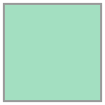

In [181]:
from shapely.geometry import Polygon
min_edge_distance=1
tile_h=100
tile_w=100
Polygon([[min_edge_distance,min_edge_distance],\
                        [min_edge_distance,tile_h-min_edge_distance],\
                        [tile_w-min_edge_distance,tile_h-min_edge_distance],\
                        [tile_w-min_edge_distance,min_edge_distance]])